In [122]:
# import libraries 
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
import matplotlib.patches as mpatches
import seaborn as sns
#import racplusplus
import pickle
from scipy.cluster import hierarchy

from scipy.cluster.hierarchy import dendrogram, fcluster
from sklearn.cluster import AgglomerativeClustering
from clusteval import clusteval

In [123]:
my_colors = ['#88292F', '#697268', '#12355B', '#D7816A']
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', my_colors)

my_colors_2 = ['#FDE74C', '#c33b43', '#697268', '#9DBF9E', '#cd5a61', '#343934', '#c91e29','#12355B','#64a0e0', '#D7816A', '#913d27', '#F46036', '#5386E4',  '#bea602', '#0a6682', '#215463']
custom_cmap_2 = LinearSegmentedColormap.from_list('custom_cmap_2', my_colors_2)

In [124]:
# import clean data set

df_wind = pd.read_csv('../../../data_analysis_and_preproc/intermediate/wind/final_wind_df.csv')

In [125]:
df_wind.head()

,asset_id,read_at,wind_speed,wind_direction,power_average,rotation_average,exterior_temperature,nacelle_temperature,farm
0,11,2021-01-01 00:00:00,8.3,296.0,802.0,15.51,-2.0,9.0,1
1,11,2021-01-01 00:20:00,8.1,298.0,666.0,14.88,-2.0,10.0,1
2,11,2021-01-01 04:20:00,5.1,297.0,137.0,9.45,-3.0,10.0,1
3,11,2021-01-01 14:20:00,7.8,301.0,614.0,14.51,-2.0,11.0,1
4,11,2021-01-01 14:40:00,7.7,301.0,611.0,14.60,-2.0,10.0,1


In [126]:
df_wind.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5379910 entries, 0 to 5379909
Data columns (total 9 columns):
 #   Column                Dtype  
---  ------                -----  
 0   asset_id              int64  
 1   read_at               object 
 2   wind_speed            float64
 3   wind_direction        float64
 4   power_average         float64
 5   rotation_average      float64
 6   exterior_temperature  float64
 7   nacelle_temperature   float64
 8   farm                  int64  
dtypes: float64(6), int64(2), object(1)
memory usage: 369.4+ MB


In [127]:
# df_wind["asset_id"] = df_wind["asset_id"].astype("category")
# df_wind["farm"] = df_wind["farm"].astype("category")

In [128]:
# cols_int = ["wind_direction", "power_average", "exterior_temperature", "nacelle_temperature"]
# df_wind[cols_int] = df_wind[cols_int].astype("int8")

# cols_float = ["wind_speed", "rotation_average"]
# df_wind[cols_float] = df_wind[cols_float].astype("float16")

In [129]:
df_wind["read_at"] = pd.to_datetime(df_wind["read_at"]).map(pd.Timestamp.timestamp)

In [130]:
df_wind["read_at"] = df_wind["read_at"].astype("uint32")
df_wind["read_at"]

0          1609459200
1          1609460400
2          1609474800
3          1609510800
4          1609512000
              ...    
5379905    1680169800
5379906    1680170400
5379907    1680171000
5379908    1680171600
5379909    1680172200
Name: read_at, Length: 5379910, dtype: uint32

In [131]:
#df_wind[cols_float+cols_int + ["read_at"]].info()

In [132]:
df_wind.head()

,asset_id,read_at,wind_speed,wind_direction,power_average,rotation_average,exterior_temperature,nacelle_temperature,farm
0,11,1609459200,8.3,296.0,802.0,15.51,-2.0,9.0,1
1,11,1609460400,8.1,298.0,666.0,14.88,-2.0,10.0,1
2,11,1609474800,5.1,297.0,137.0,9.45,-3.0,10.0,1
3,11,1609510800,7.8,301.0,614.0,14.51,-2.0,11.0,1
4,11,1609512000,7.7,301.0,611.0,14.60,-2.0,10.0,1


In [133]:
np.random.seed(10)

asset = df_wind['asset_id'].unique()[0]

length = len(df_wind[df_wind['asset_id'] == asset])

subset_size = int(0.01 * length)  # Adjust the percentage as needed

# Group the DataFrame by the asset identifier column(s)
grouped = df_wind.groupby('asset_id')

# Initialize an empty list to store the sampled data
subset_data = []

# Iterate over each group, sample subset_size rows from each group, and append to subset_data
for _, group_df in grouped:
    sampled_group = group_df.sample(n=subset_size, replace=False)
    subset_data.append(sampled_group)

# Concatenate the sampled data from all groups into a single DataFrame
df_subset = pd.concat(subset_data)

In [134]:
df_subset = df_subset.reset_index(drop=True)

In [135]:
n_components = 2
pca = PCA(n_components=n_components)

In [136]:
df_subset

,asset_id,read_at,wind_speed,wind_direction,power_average,rotation_average,exterior_temperature,nacelle_temperature,farm
0,11,1640040600,8.70,177.00,909.00,16.08,7.00,12.00,1
1,11,1632084600,2.70,-80.00,20.00,6.66,11.00,27.00,1
2,11,1653139200,6.20,-240.00,451.00,13.60,22.00,30.00,1
3,11,1643802000,9.10,114.00,1250.00,16.55,10.00,13.00,1
4,11,1660968600,5.30,-237.00,186.00,10.44,22.00,34.00,1
...,...,...,...,...,...,...,...,...,...
44796,512,1627515600,3.87,349.85,64.58,7.49,22.20,26.62,5
44797,512,1678182000,9.28,233.51,1601.56,13.88,7.74,13.57,5
44798,512,1676614800,5.75,65.59,473.77,10.54,6.43,15.73,5
44799,512,1638423000,10.18,348.22,1865.81,13.94,3.98,10.00,5


In [137]:
X = df_subset.iloc[:,1:-1]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled)

X_pca = pca.fit_transform(X_scaled)

In [138]:
# len(df_subset[df_subset['asset_id']==11])

In [139]:
# Plot dendrogram
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)
    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [140]:
X_scaled

,0,1,2,3,4,5,6
0,-0.238071,0.748283,0.599444,0.451986,1.141806,-0.779048,-1.230358
1,-0.629206,-1.251080,-0.661702,-0.908794,-1.373640,-0.203777,0.705770
2,0.405887,-0.084785,-1.446851,-0.249068,0.479566,1.378218,1.092996
3,-0.053152,0.881574,0.290291,0.973950,1.267311,-0.347595,-1.101283
4,0.790798,-0.384689,-1.432129,-0.654700,-0.364257,1.378218,1.609297
...,...,...,...,...,...,...,...
44796,-0.853829,-0.861204,1.447650,-0.840556,-1.152003,1.406982,0.656722
44797,1.637049,0.941555,0.876749,1.512078,0.554335,-0.672623,-1.027710
44798,1.560001,-0.234737,0.052735,-0.214215,-0.337554,-0.861024,-0.748907
44799,-0.317596,1.241460,1.439652,1.916562,0.570357,-1.213378,-1.488508


In [141]:
X_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44801 entries, 0 to 44800
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       44801 non-null  float64
 1   1       44801 non-null  float64
 2   2       44801 non-null  float64
 3   3       44801 non-null  float64
 4   4       44801 non-null  float64
 5   5       44801 non-null  float64
 6   6       44801 non-null  float64
dtypes: float64(7)
memory usage: 2.4 MB


In [142]:
X_scaled = X_scaled.astype('float16')
X_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44801 entries, 0 to 44800
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       44801 non-null  float16
 1   1       44801 non-null  float16
 2   2       44801 non-null  float16
 3   3       44801 non-null  float16
 4   4       44801 non-null  float16
 5   5       44801 non-null  float16
 6   6       44801 non-null  float16
dtypes: float16(7)
memory usage: 612.6 KB


# Hierarchical clustering

## Aglomerative

### Single Link

[clusteval] >INFO> Saving data in memory.
[clusteval] >INFO> Fit with method=[agglomerative], metric=[euclidean], linkage=[single]
[clusteval] >INFO> Evaluate using silhouette.
[clusteval] >INFO: 100%|██████████| 23/23 [09:51<00:00, 25.72s/it]
[clusteval] >INFO> Compute dendrogram threshold.
[clusteval] >INFO> Optimal number clusters detected: [2].
[clusteval] >INFO> Fin.


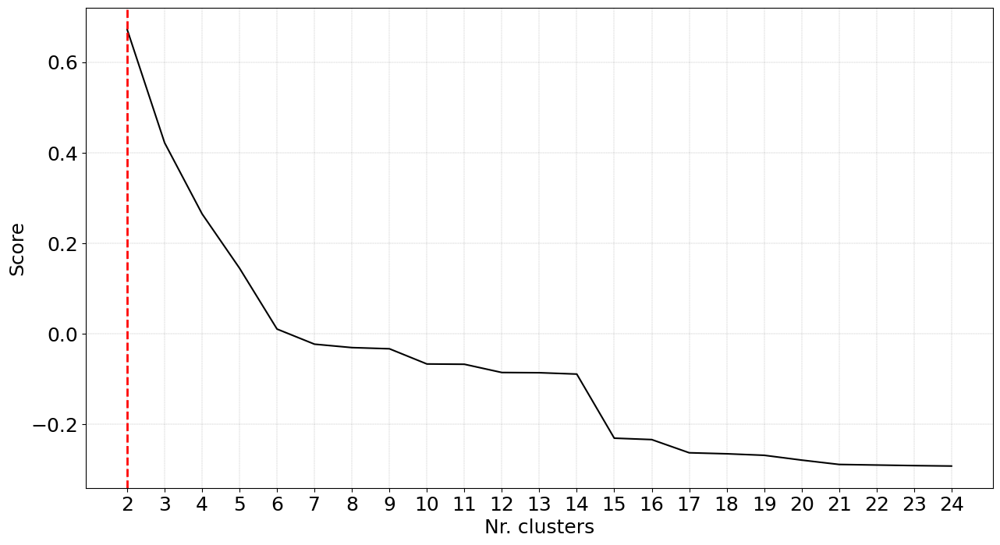

[clusteval] >INFO> Retrieving input data set.
[clusteval] >INFO> Coordinates (x, y) are set based on the first two features.
[clusteval] >INFO> Estimated number of n_clusters: 2, average silhouette_score=0.004


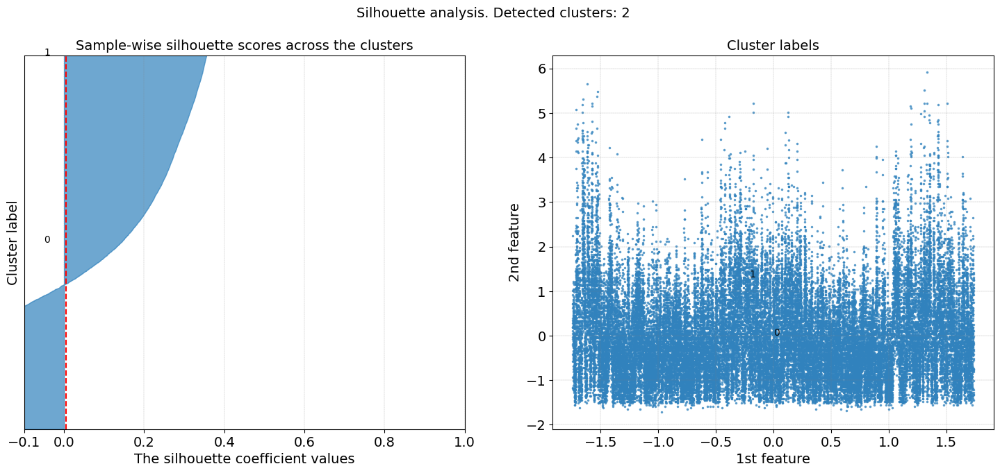

[clusteval] >INFO> Retrieving input data set.
[clusteval] >INFO> Coordinates (x, y) are set based on the first two features.
[clusteval] >INFO> Set alpha based on density because of the parameter: [opaque]
[clusteval] >INFO> Create scatterplot
[clusteval] >INFO> Retrieving input data set.
[clusteval] >INFO> Plotting the dendrogram with optimized settings: metric=euclidean, linkage=single, max_d=3.957. Be patient now..


RecursionError: maximum recursion depth exceeded while calling a Python object

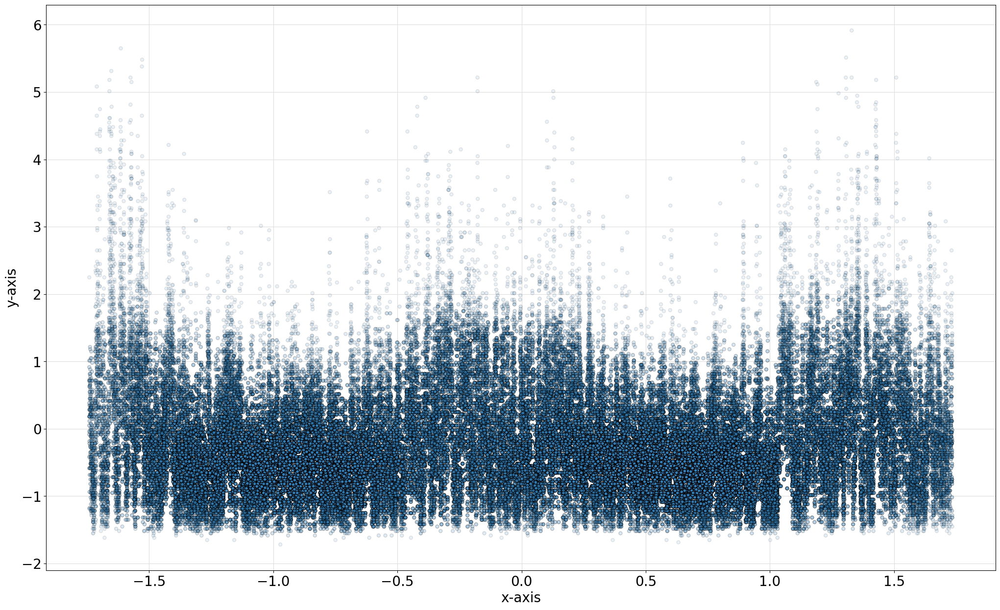

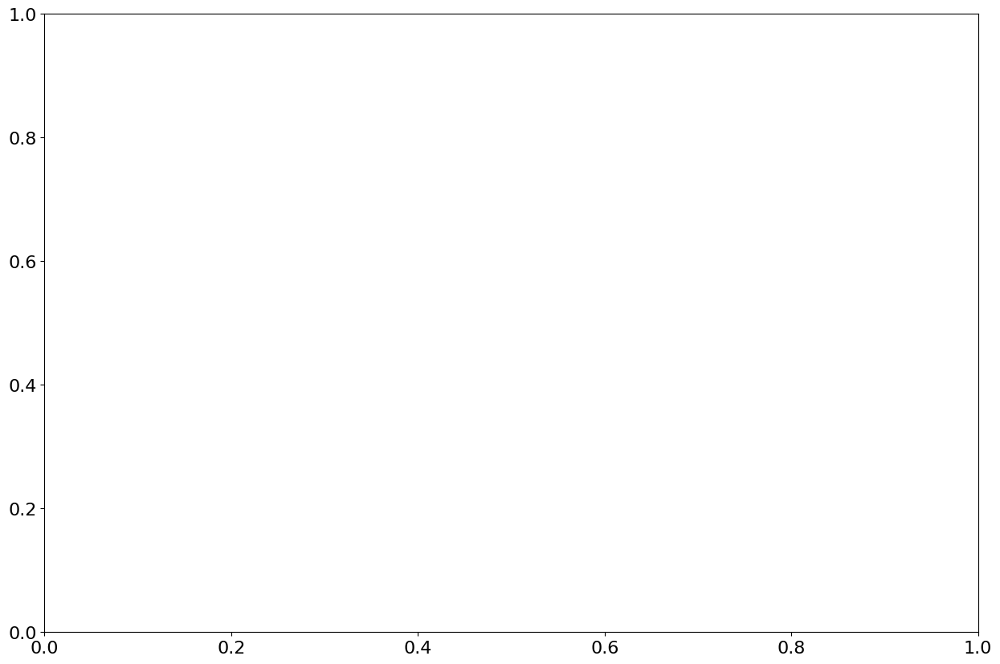

In [78]:
# Initialize
ce = clusteval(linkage= 'single', evaluate='silhouette')

# Fit
ce.fit(X_scaled)

# Plot
ce.plot()
ce.plot_silhouette()
ce.scatter()
ce.dendrogram()

In [90]:
# Fit Agglomerative Clustering model on the combined data
model_single = AgglomerativeClustering(linkage= 'single',distance_threshold=0, n_clusters=None)
model_single.fit(np.array(X_scaled))

AgglomerativeClustering(distance_threshold=0, linkage='single', n_clusters=None)

In [91]:
model_single.n_clusters_

44801

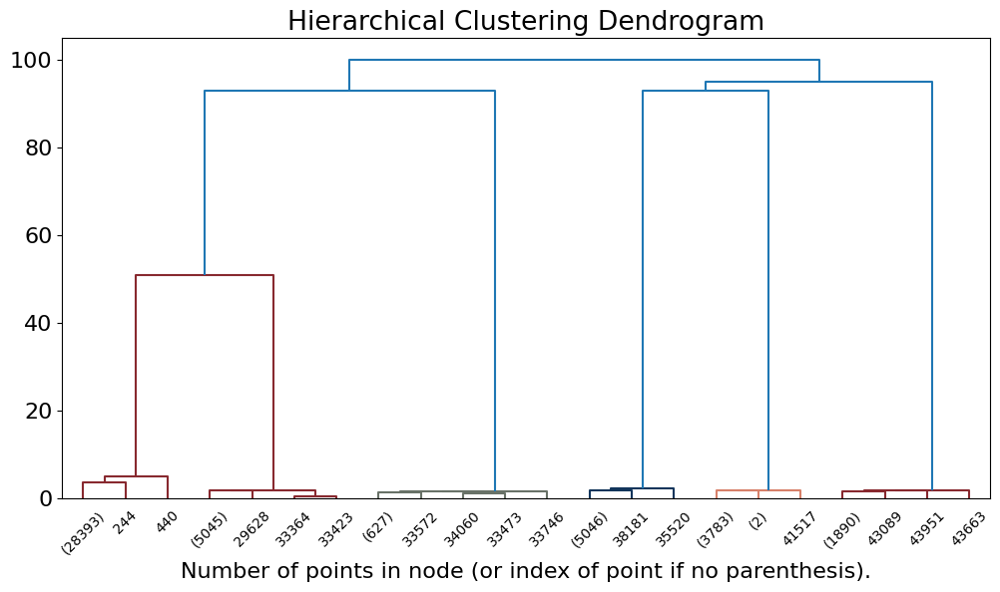

In [92]:
hierarchy.set_link_color_palette(my_colors)

plt.figure(figsize=(12, 6))
plt.title('Hierarchical Clustering Dendrogram')
# Plot the dendrogram
plot_dendrogram(model_single, truncate_mode='level', p = 4)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [216]:
# Cut dendrogram to obtain labels
num_clusters = 2  # Adjust as needed

# Convert the children_ attribute to a scipy hierarchical tree
linkage_matrix = np.column_stack([model_single.children_, model_single.distances_,
                                  np.ones_like(model_single.distances_)])
# Cut the tree to obtain labels
labels_cut = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

print(labels_cut)

[1 1 1 ... 2 2 2]


In [217]:
X_scaled = X_scaled.drop(columns=['cluster_label', 'asset_id'])
df_wind = df_wind.drop(columns=['cluster_label'])

In [218]:
# Assign the cluster labels to the original DataFrame
X_scaled['cluster_label'] = labels_cut
X_scaled['asset_id'] = df_subset['asset_id']

/tmp/ipykernel_40350/1358810534.py:21: UserWarning: The palette list has more values (4) than needed (2), which may not be intended.
  sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_label', palette=color_palette, s=5)


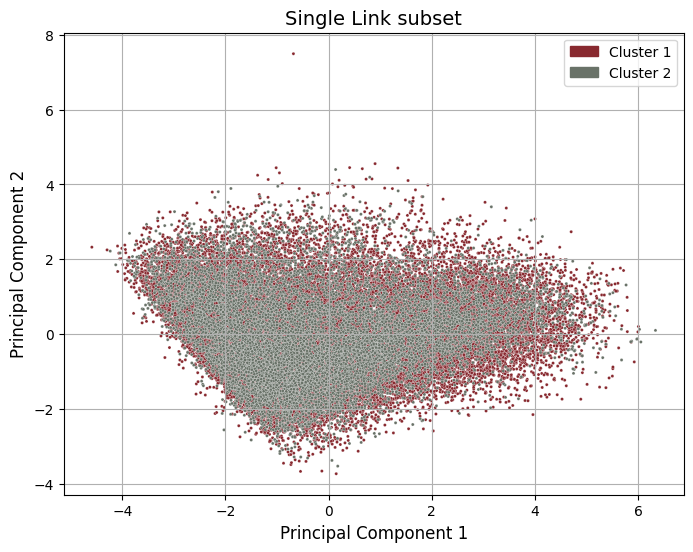

In [120]:
features = ['wind_speed', 'wind_direction', 'power_average', 'rotation_average', 'exterior_temperature', 'nacelle_temperature']

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df_subset[features])

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)

# Create DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

# Add 'cluster' column back to DataFrame
pca_df['cluster_label'] = X_scaled['cluster_label']

color_palette = sns.color_palette(my_colors)

# Plot the representative points on a scatter plot using PCA results
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_label', palette=color_palette, s=5)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.title('Single Link subset' , fontsize=14)
legend_handles = [mpatches.Circle((0, 0), radius=1, color=color) for color in my_colors]
plt.legend(handles=legend_handles, labels=[f'Cluster {cluster_label}' for cluster_label in np.unique(pca_df['cluster_label'])], fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.grid(True)
plt.show()

In [219]:
most_frequent_clusters = X_scaled.groupby('asset_id')['cluster_label'].agg(lambda x: np.bincount(x).argmax())

# Merge the most frequent cluster labels back to the original DataFrame
#df_wind = df_wind.drop(columns='cluster')

df_wind = pd.merge(df_wind, most_frequent_clusters, on='asset_id', how='left')

df_wind.head()

,asset_id,read_at,wind_speed,wind_direction,power_average,rotation_average,exterior_temperature,nacelle_temperature,farm,cluster_label
0,11,1609459200,8.3,296.0,802.0,15.51,-2.0,9.0,1,1
1,11,1609460400,8.1,298.0,666.0,14.88,-2.0,10.0,1,1
2,11,1609474800,5.1,297.0,137.0,9.45,-3.0,10.0,1,1
3,11,1609510800,7.8,301.0,614.0,14.51,-2.0,11.0,1,1
4,11,1609512000,7.7,301.0,611.0,14.60,-2.0,10.0,1,1


In [220]:
len(most_frequent_clusters.unique())

2

/tmp/ipykernel_40350/3542289506.py:21: UserWarning: The palette list has more values (4) than needed (2), which may not be intended.
  sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_label', palette=color_palette, s=0.1)


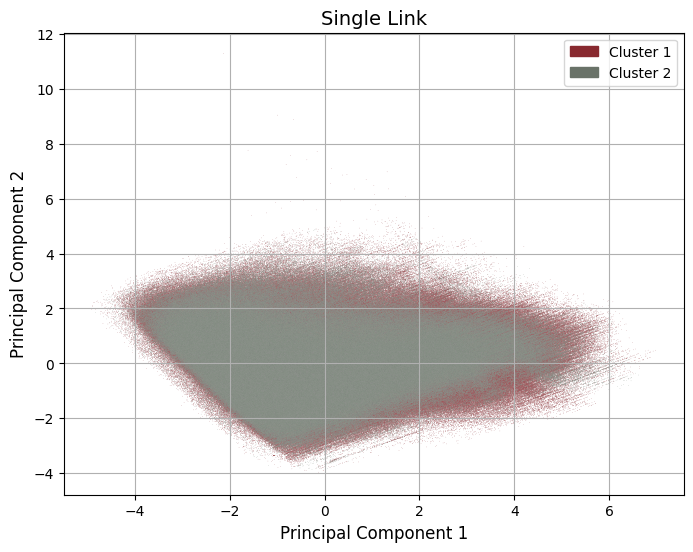

In [121]:
features = ['wind_speed', 'wind_direction', 'power_average', 'rotation_average', 'exterior_temperature', 'nacelle_temperature']

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df_wind[features])

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)

# Create DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

# Add 'cluster' column back to DataFrame
pca_df['cluster_label'] = df_wind['cluster_label']

color_palette = sns.color_palette(my_colors)

# Plot the representative points on a scatter plot using PCA results
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_label', palette=color_palette, s=0.1)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.title('Single Link' , fontsize=14)
legend_handles = [mpatches.Circle((0, 0), radius=1, color=color) for color in my_colors]
plt.legend(handles=legend_handles, labels=[f'Cluster {cluster_label}' for cluster_label in np.unique(pca_df['cluster_label'])], fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.grid(True)
plt.show()

In [99]:
representative_points = df_wind.groupby(['asset_id']).first().reset_index()
representative_points

,asset_id,read_at,wind_speed,wind_direction,power_average,rotation_average,exterior_temperature,nacelle_temperature,farm,cluster_label
0,11,1609459200,8.30,296.00,802.00,15.51,-2.00,9.00,1,1
1,12,1609459800,8.50,314.00,832.00,15.54,-1.00,12.00,1,1
2,13,1609459200,8.10,-49.00,749.00,15.23,-2.00,5.00,1,1
3,14,1609459200,8.60,-38.00,925.00,15.96,-1.00,15.00,1,1
4,15,1609459200,8.80,-47.00,998.00,16.11,-2.00,7.00,1,1
...,...,...,...,...,...,...,...,...,...,...
66,414,1609599600,3.70,-362.00,62.00,7.75,7.00,15.00,4,2
67,415,1609459200,4.50,285.00,128.00,9.39,2.00,11.00,4,2
68,510,1609459200,8.45,306.80,1329.78,13.81,1.21,8.06,5,2
69,511,1609459200,8.32,301.15,1310.88,13.66,3.46,10.68,5,2


/tmp/ipykernel_40350/460720391.py:21: UserWarning: The palette list has more values (4) than needed (2), which may not be intended.
  sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_label', palette=color_palette, s=100)


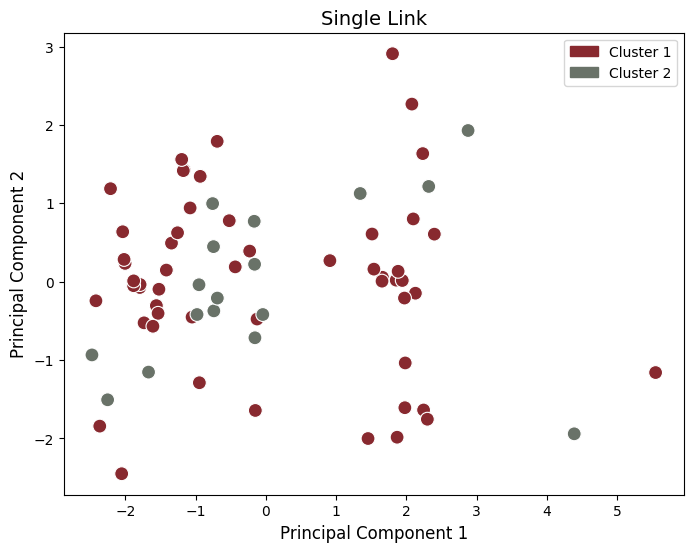

In [113]:
features = ['wind_speed', 'wind_direction', 'power_average', 'rotation_average', 'exterior_temperature', 'nacelle_temperature']

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(representative_points[features])

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)

# Create DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

# Add 'cluster' column back to DataFrame
pca_df['cluster_label'] = representative_points['cluster_label']

color_palette = sns.color_palette(my_colors)

# Plot the representative points on a scatter plot using PCA results
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_label', palette=color_palette, s=100)
plt.title('Single Link', fontsize = 14)
plt.xlabel('Principal Component 1', fontsize = 12)
plt.ylabel('Principal Component 2', fontsize = 12)
plt.legend(handles=legend_handles, labels=[f'Cluster {cluster_label}' for cluster_label in np.unique(pca_df['cluster_label'])], fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.show()

In [221]:
with open('results/hierarchical/single_clustering_opt.pickle', 'wb') as f:
    pickle.dump(model_single, f)

In [222]:
df_wind.to_csv('results/hierarchical/single_link_opt.csv')

In [67]:
df_wind = df_wind.drop(columns='cluster_label')

In [68]:
X_scaled = X_scaled.drop(columns=['cluster_label', 'asset_id'])

### Average Link

[clusteval] >INFO> Saving data in memory.
[clusteval] >INFO> Fit with method=[agglomerative], metric=[euclidean], linkage=[average]
[clusteval] >INFO> Evaluate using silhouette.
[clusteval] >INFO: 100%|██████████| 23/23 [09:03<00:00, 23.63s/it]
[clusteval] >INFO> Compute dendrogram threshold.
[clusteval] >INFO> Optimal number clusters detected: [2].
[clusteval] >INFO> Fin.


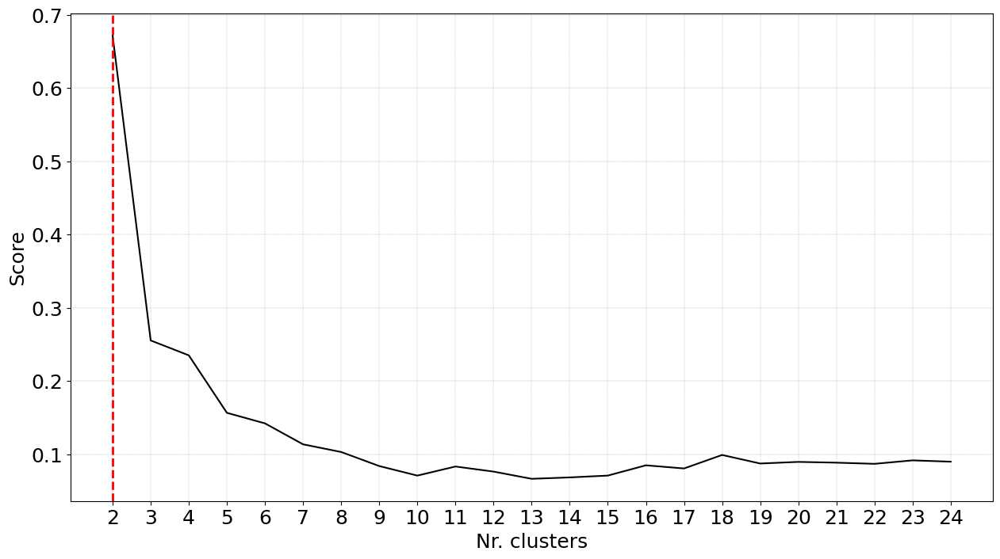

[clusteval] >INFO> Retrieving input data set.
[clusteval] >INFO> Coordinates (x, y) are set based on the first two features.
[clusteval] >INFO> Estimated number of n_clusters: 2, average silhouette_score=0.004


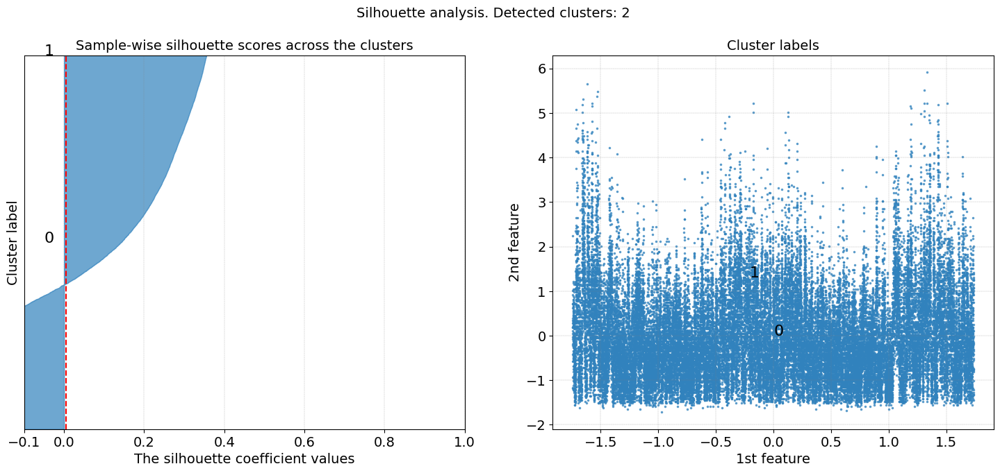

[clusteval] >INFO> Retrieving input data set.
[clusteval] >INFO> Coordinates (x, y) are set based on the first two features.
[clusteval] >INFO> Set alpha based on density because of the parameter: [opaque]
[clusteval] >INFO> Create scatterplot
[clusteval] >INFO> Retrieving input data set.
[clusteval] >INFO> Plotting the dendrogram with optimized settings: metric=euclidean, linkage=average, max_d=7.783. Be patient now..
[clusteval] >INFO> Compute cluster labels.


{'icoord': [[25.0, 25.0, 35.0, 35.0],
  [15.0, 15.0, 30.0, 30.0],
  [55.0, 55.0, 65.0, 65.0],
  [45.0, 45.0, 60.0, 60.0],
  [75.0, 75.0, 85.0, 85.0],
  [105.0, 105.0, 115.0, 115.0],
  [95.0, 95.0, 110.0, 110.0],
  [80.0, 80.0, 102.5, 102.5],
  [125.0, 125.0, 135.0, 135.0],
  [155.0, 155.0, 165.0, 165.0],
  [145.0, 145.0, 160.0, 160.0],
  [130.0, 130.0, 152.5, 152.5],
  [91.25, 91.25, 141.25, 141.25],
  [52.5, 52.5, 116.25, 116.25],
  [175.0, 175.0, 185.0, 185.0],
  [205.0, 205.0, 215.0, 215.0],
  [225.0, 225.0, 235.0, 235.0],
  [210.0, 210.0, 230.0, 230.0],
  [195.0, 195.0, 220.0, 220.0],
  [255.0, 255.0, 265.0, 265.0],
  [285.0, 285.0, 295.0, 295.0],
  [275.0, 275.0, 290.0, 290.0],
  [260.0, 260.0, 282.5, 282.5],
  [245.0, 245.0, 271.25, 271.25],
  [207.5, 207.5, 258.125, 258.125],
  [180.0, 180.0, 232.8125, 232.8125],
  [84.375, 84.375, 206.40625, 206.40625],
  [22.5, 22.5, 145.390625, 145.390625],
  [325.0, 325.0, 335.0, 335.0],
  [315.0, 315.0, 330.0, 330.0],
  [305.0, 305.0, 322.5

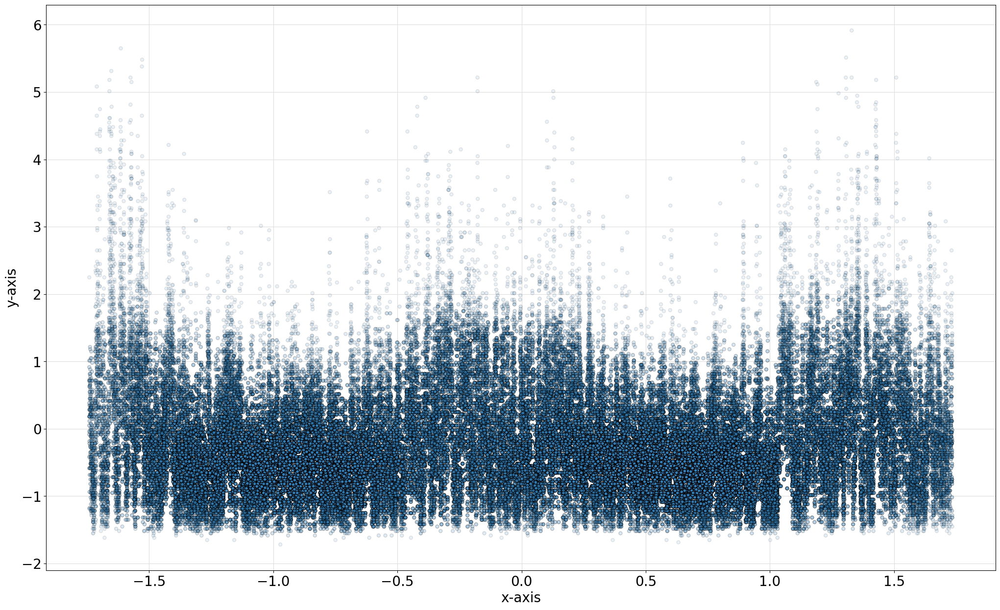

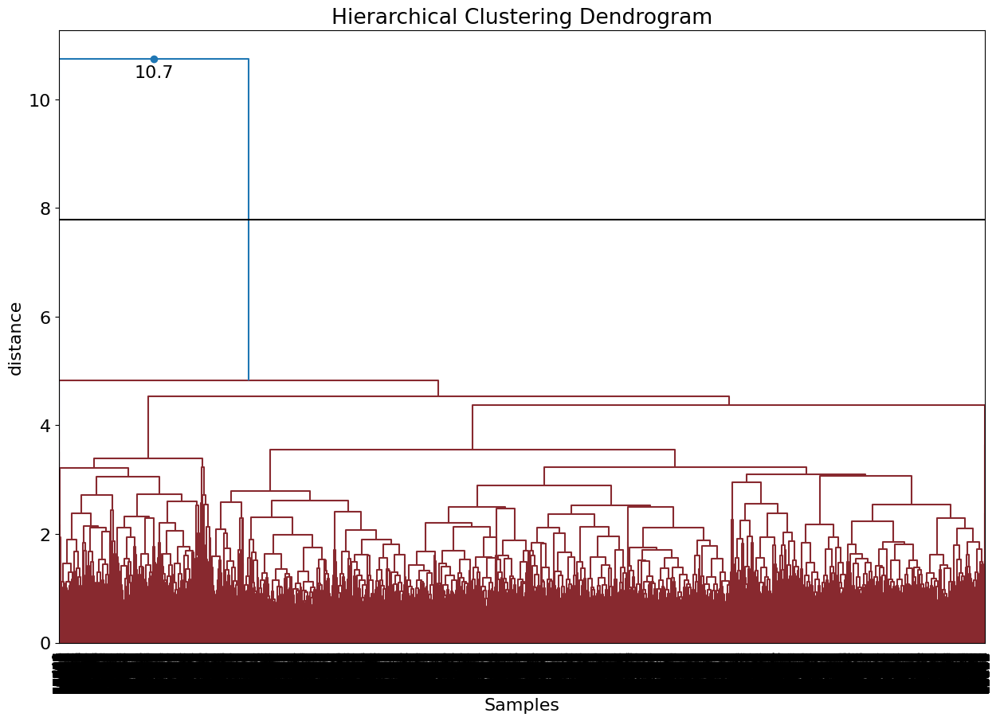

In [143]:
# Initialize
ce = clusteval(linkage= 'average',evaluate='silhouette')

# Fit
ce.fit(X_scaled)

# Plot
ce.plot()
ce.plot_silhouette()
ce.scatter()
ce.dendrogram()

In [144]:
model_average = AgglomerativeClustering(linkage='average', distance_threshold=0, n_clusters=None)
model_average.fit(np.array(X_scaled))

AgglomerativeClustering(distance_threshold=0, linkage='average',
                        n_clusters=None)

In [203]:
# Cut dendrogram to obtain labels
num_clusters = 18  # Adjust as needed

# Convert the children_ attribute to a scipy hierarchical tree
linkage_matrix = np.column_stack([model_average.children_, model_average.distances_,
                                  np.ones_like(model_average.distances_)])
# Cut the tree to obtain labels
labels_cut = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

print(labels_cut)

[15  9 13 ... 14  6 11]


In [204]:
df_wind = df_wind.drop(columns=['cluster_label'])
X_scaled = X_scaled.drop(columns=['cluster_label', 'asset_id'])

In [205]:
# Assign the cluster labels to the original DataFrame
X_scaled['cluster_label'] = labels_cut

In [206]:
X_scaled['asset_id'] = df_subset['asset_id']

In [207]:
most_frequent_clusters = X_scaled.groupby('asset_id')['cluster_label'].agg(lambda x: np.bincount(x).argmax())

# Merge the most frequent cluster labels back to the original DataFrame
#df_wind = df_wind.drop(columns='cluster')

df_wind = pd.merge(df_wind, most_frequent_clusters, on='asset_id', how='left')

df_wind.head()



,asset_id,read_at,wind_speed,wind_direction,power_average,rotation_average,exterior_temperature,nacelle_temperature,farm,cluster_label
0,11,1609459200,8.3,296.0,802.0,15.51,-2.0,9.0,1,11
1,11,1609460400,8.1,298.0,666.0,14.88,-2.0,10.0,1,11
2,11,1609474800,5.1,297.0,137.0,9.45,-3.0,10.0,1,11
3,11,1609510800,7.8,301.0,614.0,14.51,-2.0,11.0,1,11
4,11,1609512000,7.7,301.0,611.0,14.60,-2.0,10.0,1,11


In [208]:
len(most_frequent_clusters.unique())

4

In [209]:
representative_points = df_wind.groupby(['asset_id']).first().reset_index()
representative_points

,asset_id,read_at,wind_speed,wind_direction,power_average,rotation_average,exterior_temperature,nacelle_temperature,farm,cluster_label
0,11,1609459200,8.30,296.00,802.00,15.51,-2.00,9.00,1,11
1,12,1609459800,8.50,314.00,832.00,15.54,-1.00,12.00,1,11
2,13,1609459200,8.10,-49.00,749.00,15.23,-2.00,5.00,1,11
3,14,1609459200,8.60,-38.00,925.00,15.96,-1.00,15.00,1,9
4,15,1609459200,8.80,-47.00,998.00,16.11,-2.00,7.00,1,11
...,...,...,...,...,...,...,...,...,...,...
66,414,1609599600,3.70,-362.00,62.00,7.75,7.00,15.00,4,11
67,415,1609459200,4.50,285.00,128.00,9.39,2.00,11.00,4,11
68,510,1609459200,8.45,306.80,1329.78,13.81,1.21,8.06,5,9
69,511,1609459200,8.32,301.15,1310.88,13.66,3.46,10.68,5,9


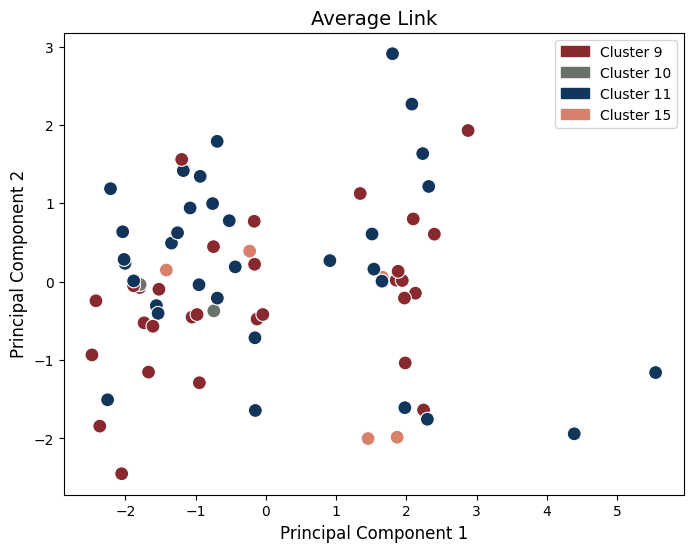

In [211]:
features = ['wind_speed', 'wind_direction', 'power_average', 'rotation_average', 'exterior_temperature', 'nacelle_temperature']

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(representative_points[features])

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)

# Create DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

# Add 'cluster' column back to DataFrame
pca_df['cluster_label'] = representative_points['cluster_label']

color_palette = sns.color_palette(my_colors)

# Plot the representative points on a scatter plot using PCA results
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_label', palette=color_palette, s=100)
plt.title('Average Link', fontsize = 14)
plt.xlabel('Principal Component 1', fontsize = 12)
plt.ylabel('Principal Component 2', fontsize = 12)
plt.legend(handles=legend_handles, labels=[f'Cluster {cluster_label}' for cluster_label in np.unique(pca_df['cluster_label'])], fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.show()

In [212]:
with open('results/hierarchical/average_clustering_opt.pickle', 'wb') as f:
    pickle.dump(model_average, f)

In [213]:
df_wind.to_csv('results/hierarchical/average_link_opt.csv')

In [54]:
df_wind = df_wind.drop(columns='cluster_label')

In [55]:
X_scaled = X_scaled.drop(columns=['cluster_label', 'asset_id'])

### Ward's method

[clusteval] >INFO> Saving data in memory.
[clusteval] >INFO> Fit with method=[agglomerative], metric=[euclidean], linkage=[ward]
[clusteval] >INFO> Evaluate using silhouette.
[clusteval] >INFO: 100%|██████████| 23/23 [08:43<00:00, 22.76s/it]
[clusteval] >INFO> Compute dendrogram threshold.
[clusteval] >INFO> Optimal number clusters detected: [2].
[clusteval] >INFO> Fin.


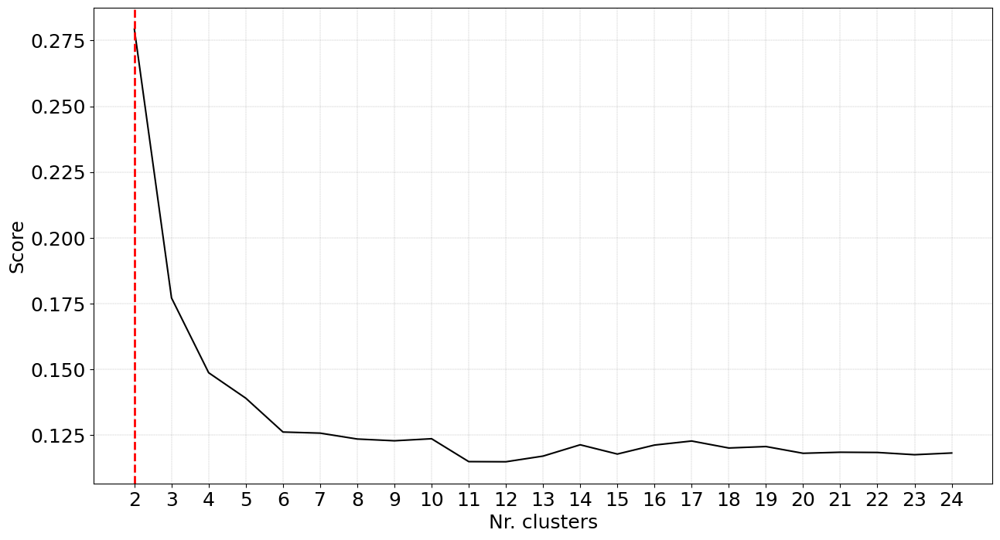

[clusteval] >INFO> Retrieving input data set.
[clusteval] >INFO> Coordinates (x, y) are set based on the first two features.
[clusteval] >INFO> Estimated number of n_clusters: 2, average silhouette_score=0.301


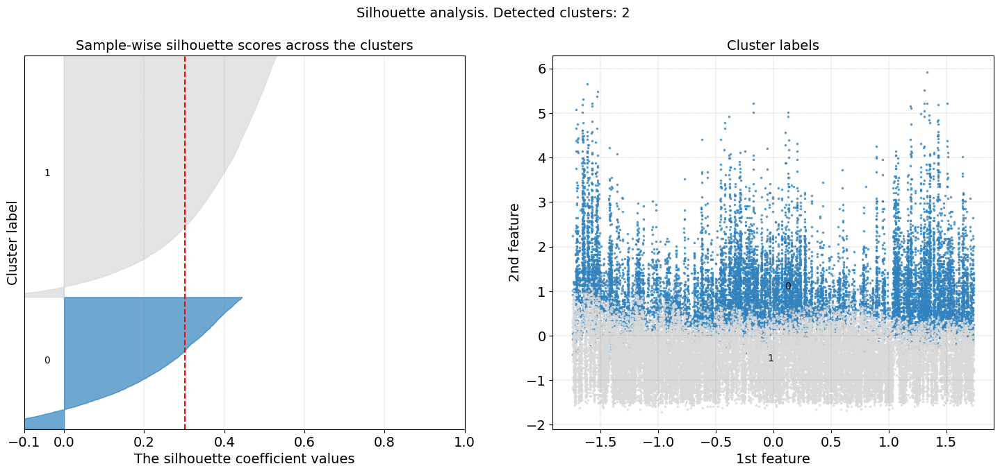

[clusteval] >INFO> Retrieving input data set.
[clusteval] >INFO> Coordinates (x, y) are set based on the first two features.
[clusteval] >INFO> Set alpha based on density because of the parameter: [opaque]
[clusteval] >INFO> Create scatterplot
[clusteval] >INFO> Retrieving input data set.
[clusteval] >INFO> Plotting the dendrogram with optimized settings: metric=euclidean, linkage=ward, max_d=343.588. Be patient now..
[clusteval] >INFO> Compute cluster labels.


{'icoord': [[25.0, 25.0, 35.0, 35.0],
  [45.0, 45.0, 55.0, 55.0],
  [30.0, 30.0, 50.0, 50.0],
  [15.0, 15.0, 40.0, 40.0],
  [5.0, 5.0, 27.5, 27.5],
  [65.0, 65.0, 75.0, 75.0],
  [95.0, 95.0, 105.0, 105.0],
  [85.0, 85.0, 100.0, 100.0],
  [70.0, 70.0, 92.5, 92.5],
  [125.0, 125.0, 135.0, 135.0],
  [115.0, 115.0, 130.0, 130.0],
  [165.0, 165.0, 175.0, 175.0],
  [155.0, 155.0, 170.0, 170.0],
  [145.0, 145.0, 162.5, 162.5],
  [122.5, 122.5, 153.75, 153.75],
  [81.25, 81.25, 138.125, 138.125],
  [16.25, 16.25, 109.6875, 109.6875],
  [195.0, 195.0, 205.0, 205.0],
  [185.0, 185.0, 200.0, 200.0],
  [225.0, 225.0, 235.0, 235.0],
  [215.0, 215.0, 230.0, 230.0],
  [192.5, 192.5, 222.5, 222.5],
  [255.0, 255.0, 265.0, 265.0],
  [245.0, 245.0, 260.0, 260.0],
  [295.0, 295.0, 305.0, 305.0],
  [285.0, 285.0, 300.0, 300.0],
  [275.0, 275.0, 292.5, 292.5],
  [315.0, 315.0, 325.0, 325.0],
  [345.0, 345.0, 355.0, 355.0],
  [335.0, 335.0, 350.0, 350.0],
  [320.0, 320.0, 342.5, 342.5],
  [283.75, 283.75, 3

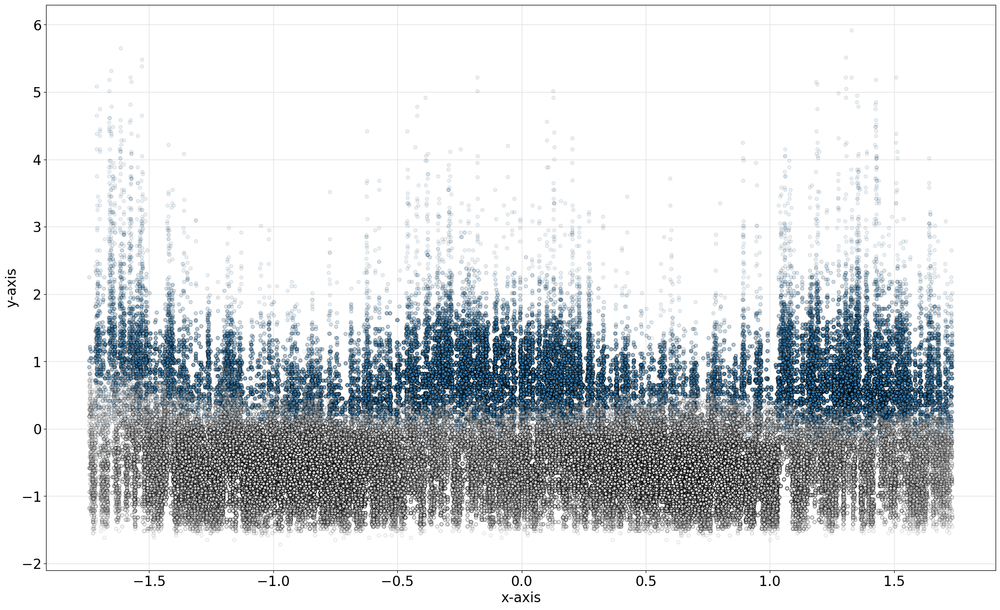

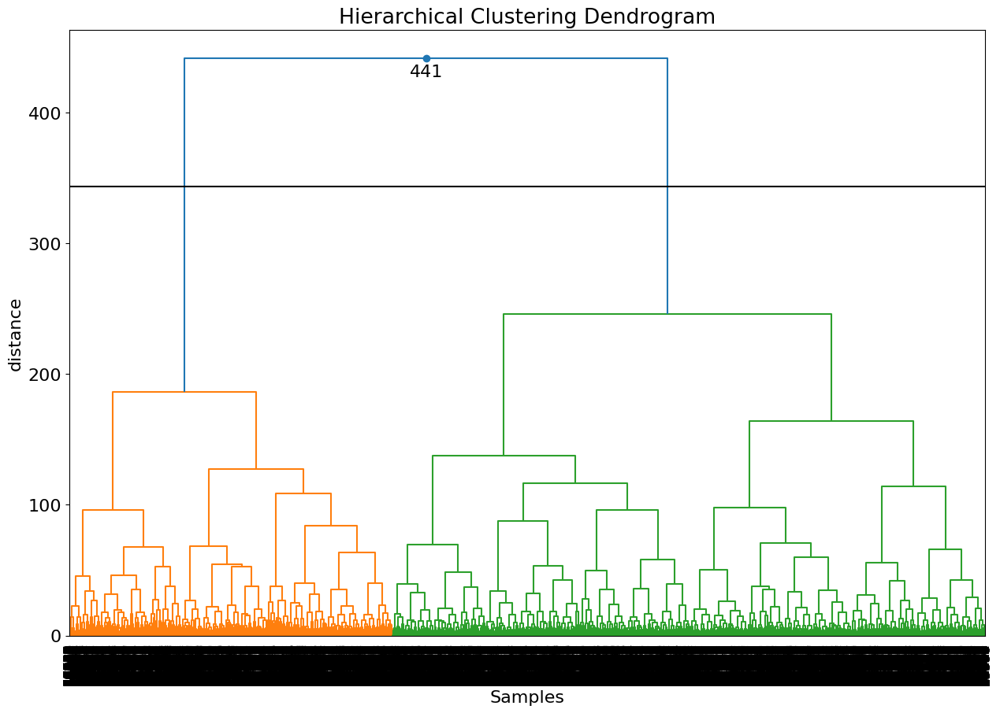

In [ ]:
# Initialize
ce = clusteval(evaluate='silhouette')

# Fit
ce.fit(X_scaled)

# Plot
ce.plot()
ce.plot_silhouette()
ce.scatter()
ce.dendrogram()

In [38]:
model_ward = AgglomerativeClustering(linkage='ward', distance_threshold=0.5, n_clusters=None)
model_ward.fit(np.array(X_scaled))

AgglomerativeClustering(distance_threshold=0.5, n_clusters=None)

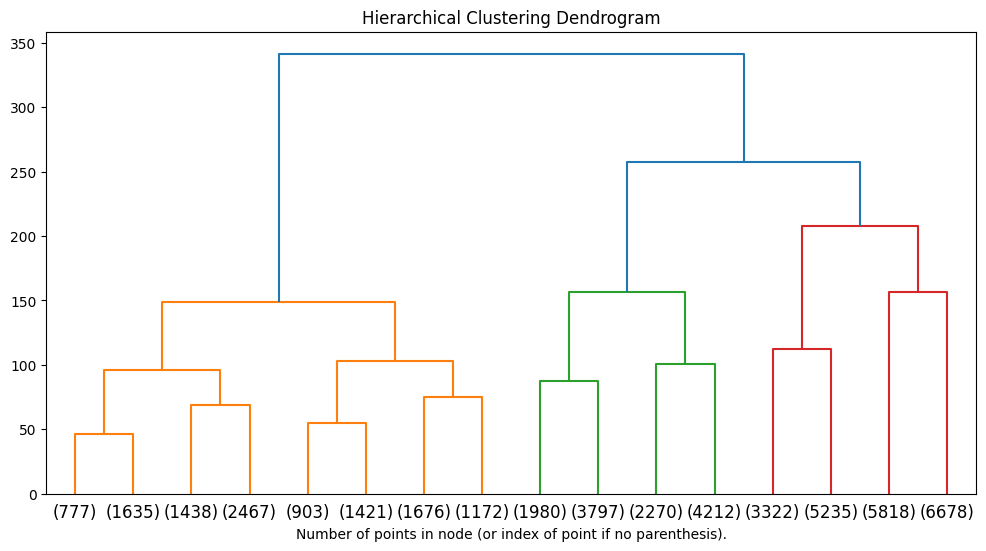

In [23]:
plt.figure(figsize=(12, 6))
plt.title('Hierarchical Clustering Dendrogram')
# Plot the dendrogram
plot_dendrogram(model_ward, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [24]:
df_wind.head()

,asset_id,read_at,wind_speed,wind_direction,power_average,rotation_average,exterior_temperature,nacelle_temperature,farm
0,11,1609459200,8.3,296.0,802.0,15.51,-2.0,9.0,1
1,11,1609460400,8.1,298.0,666.0,14.88,-2.0,10.0,1
2,11,1609474800,5.1,297.0,137.0,9.45,-3.0,10.0,1
3,11,1609510800,7.8,301.0,614.0,14.51,-2.0,11.0,1
4,11,1609512000,7.7,301.0,611.0,14.60,-2.0,10.0,1


In [25]:
X_scaled

,0,1,2,3,4,5,6
0,-0.238037,0.748047,0.599609,0.451904,1.141602,-0.778809,-1.230469
1,-0.629395,-1.250977,-0.661621,-0.908691,-1.374023,-0.203735,0.705566
2,0.406006,-0.084778,-1.447266,-0.249023,0.479492,1.377930,1.092773
3,-0.053162,0.881348,0.290283,0.974121,1.267578,-0.347656,-1.101562
4,0.791016,-0.384766,-1.432617,-0.654785,-0.364258,1.377930,1.609375
...,...,...,...,...,...,...,...
44796,-0.854004,-0.861328,1.447266,-0.840332,-1.152344,1.407227,0.656738
44797,1.636719,0.941406,0.876953,1.511719,0.554199,-0.672852,-1.027344
44798,1.559570,-0.234741,0.052734,-0.214233,-0.337646,-0.860840,-0.749023
44799,-0.317627,1.241211,1.439453,1.916992,0.570312,-1.212891,-1.488281


In [225]:
X_scaled = X_scaled.drop(columns=['cluster_label', 'asset_id'])
df_wind = df_wind.drop(columns='cluster_label')

In [223]:
# Cut dendrogram to obtain labels
num_clusters = 3  # Adjust as needed

# Convert the children_ attribute to a scipy hierarchical tree
linkage_matrix = np.column_stack([model_ward.children_, model_ward.distances_,
                                  np.ones_like(model_ward.distances_)])
# Cut the tree to obtain labels
labels_cut = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

print(labels_cut)

[3 3 2 ... 3 1 3]


In [227]:
# Assign the cluster labels to the original DataFrame
X_scaled['cluster_label'] = labels_cut

In [228]:
X_scaled['asset_id'] = df_subset['asset_id']

In [229]:
most_frequent_clusters = X_scaled.groupby('asset_id')['cluster_label'].agg(lambda x: np.bincount(x).argmax())

# Merge the most frequent cluster labels back to the original DataFrame
#df_wind = df_wind.drop(columns='cluster')

df_wind = pd.merge(df_wind, most_frequent_clusters, on='asset_id', how='left')

df_wind.head()

,asset_id,read_at,wind_speed,wind_direction,power_average,rotation_average,exterior_temperature,nacelle_temperature,farm,cluster_label
0,11,1609459200,8.3,296.0,802.0,15.51,-2.0,9.0,1,3
1,11,1609460400,8.1,298.0,666.0,14.88,-2.0,10.0,1,3
2,11,1609474800,5.1,297.0,137.0,9.45,-3.0,10.0,1,3
3,11,1609510800,7.8,301.0,614.0,14.51,-2.0,11.0,1,3
4,11,1609512000,7.7,301.0,611.0,14.60,-2.0,10.0,1,3


In [230]:
len(most_frequent_clusters.unique())

2

In [231]:
representative_points = df_wind.groupby(['asset_id']).first().reset_index()
representative_points

,asset_id,read_at,wind_speed,wind_direction,power_average,rotation_average,exterior_temperature,nacelle_temperature,farm,cluster_label
0,11,1609459200,8.30,296.00,802.00,15.51,-2.00,9.00,1,3
1,12,1609459800,8.50,314.00,832.00,15.54,-1.00,12.00,1,3
2,13,1609459200,8.10,-49.00,749.00,15.23,-2.00,5.00,1,3
3,14,1609459200,8.60,-38.00,925.00,15.96,-1.00,15.00,1,3
4,15,1609459200,8.80,-47.00,998.00,16.11,-2.00,7.00,1,3
...,...,...,...,...,...,...,...,...,...,...
66,414,1609599600,3.70,-362.00,62.00,7.75,7.00,15.00,4,3
67,415,1609459200,4.50,285.00,128.00,9.39,2.00,11.00,4,3
68,510,1609459200,8.45,306.80,1329.78,13.81,1.21,8.06,5,3
69,511,1609459200,8.32,301.15,1310.88,13.66,3.46,10.68,5,3


/tmp/ipykernel_40350/2497514629.py:21: UserWarning: The palette list has more values (4) than needed (2), which may not be intended.
  sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_label', palette=color_palette, s=100)


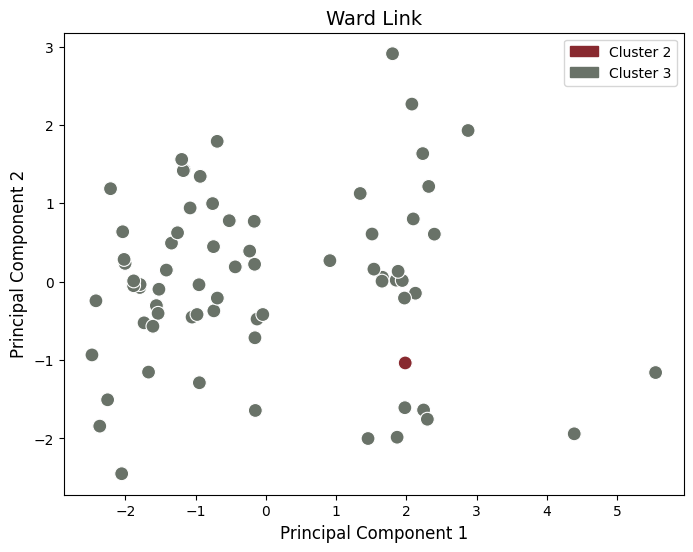

In [237]:
features = ['wind_speed', 'wind_direction', 'power_average', 'rotation_average', 'exterior_temperature', 'nacelle_temperature']

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(representative_points[features])

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)

# Create DataFrame with PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

# Add 'cluster' column back to DataFrame
pca_df['cluster_label'] = representative_points['cluster_label']

color_palette = sns.color_palette(my_colors)

# Plot the representative points on a scatter plot using PCA results
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_label', palette=color_palette, s=100)
plt.title('Ward Link', fontsize = 14)
plt.xlabel('Principal Component 1', fontsize = 12)
plt.ylabel('Principal Component 2', fontsize = 12)
plt.legend(handles=legend_handles, labels=[f'Cluster {cluster_label}' for cluster_label in np.unique(pca_df['cluster_label'])], fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.show()

In [233]:
with open('results/hierarchical/ward_clustering_opt.pickle', 'wb') as f:
    pickle.dump(model_ward, f)

In [234]:
df_wind.to_csv('results/hierarchical/ward_link_opt.csv')

In [235]:
df_wind = df_wind.drop(columns='cluster_label')
X_scaled = X_scaled.drop(columns=['cluster_label', 'asset_id'])